# [Trilemma Foundation](https://www.trilemma.foundation/) x [Strategy](https://www.strategy.com/) Stacking Sats Tournament

**Hosted on [Hypertrial.ai](https://www.hypertrial.ai/)**

### Model Development Template

---

## 🧭 Model Development Workflow

Follow these steps to build and evaluate your Bitcoin accumulation strategy:

1. ✅ **Ensure your virtual environment is set up**  
   (Refer to the setup tutorial if not already done)

2. 🔄 **Restart the kernel and run all cells**  
   This confirms your environment is working and dependencies are correctly installed

3. ✍️ **Insert your strategy in the Model Development cell**  
   The Prelude and Runner cells are boilerplate — do not modify them

4. 📈 **Iterate on your model**  
   Look for: ✅ *“Strategy is ready for submission”*  
   and your **Final Model Score** at the end of the output

5. 🚀 **Finalize and submit**  
   Double-check boilerplate code is unchanged, then push your notebook to a public GitHub repo named  
   `btc_accumulation_model.ipynb` and link it in the submission form

## Prelude - Do Not Change → You Will Be Disqualified 🚫

In [39]:
# ═══════════════════════════════════════════════════════════════════════════════
#                                     IMPORTS
# ═══════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import polars as pl
import scipy
import statsmodels.api as sm
import sklearn
import networkx as nx
import pgmpy as pg
import pymc as pm
from prophet import Prophet
import requests
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import logging
from io import BytesIO
import pyarrow

# Configure logging
logging.basicConfig(
    format='%(asctime)s %(levelname)-8s %(message)s',
    level=logging.INFO,
    datefmt='%Y-%m-%d %H:%M:%S'
)

# ═══════════════════════════════════════════════════════════════════════════════
#                                  CONFIGURATION
# ═══════════════════════════════════════════════════════════════════════════════

# Backtest parameters
BACKTEST_START = '2016-01-01'
BACKTEST_END = '2025-06-01'
INVESTMENT_WINDOW = 12  # months
PURCHASE_FREQ = 'Daily'  # 'Daily', 'Weekly', or 'Monthly'
MIN_WEIGHT = 1e-5

PURCHASE_FREQ_TO_OFFSET = {
    'Daily': '1D',
    'Weekly': '7D',
    'Monthly': '1M',
}

# ═══════════════════════════════════════════════════════════════════════════════
#                                 DATA FUNCTIONS
# ═══════════════════════════════════════════════════════════════════════════════

def load_data():
    """Load crypto data directly from GitHub parquet file."""
    url = "https://raw.githubusercontent.com/TrilemmaFoundation/stacking-sats-tournament-mstr-2025/main/data/stacking_sats_data.parquet"
    
    response = requests.get(url)
    response.raise_for_status()
    
    # Read parquet data from bytes
    df = pd.read_parquet(BytesIO(response.content))
    
    # Ensure proper datetime index
    if df.index.name != 'time' and 'time' in df.columns:
        df.set_index('time', inplace=True)
    
    # Clean and sort data
    df.index = pd.to_datetime(df.index).normalize()
    df.index = df.index.tz_localize(None) if df.index.tz is not None else df.index
    df = df.loc[~df.index.duplicated(keep='last')]
    df = df.sort_index()
    
    return df

# ═══════════════════════════════════════════════════════════════════════════════
#                              COMPUTATION FUNCTIONS
# ═══════════════════════════════════════════════════════════════════════════════

def _make_window_label(window_start: pd.Timestamp, window_end: pd.Timestamp) -> str:
    """Format human-readable rolling window label as 'YYYY-MM-DD → YYYY-MM-DD'."""
    start_str = pd.to_datetime(window_start).strftime("%Y-%m-%d")
    end_str = pd.to_datetime(window_end).strftime("%Y-%m-%d")
    return f"{start_str} → {end_str}"


def compute_cycle_spd(dataframe: pd.DataFrame, strategy_function) -> pd.DataFrame:
    """
    Compute sats-per-dollar (SPD) statistics over rolling windows.
    
    Uses full-history features with no look-ahead bias. Returns DataFrame with
    SPD statistics and percentiles for uniform vs dynamic strategies.
    """
    # Precompute full-history features & restrict to backtest period
    full_feat = construct_features(dataframe).loc[BACKTEST_START:BACKTEST_END]
    
    window_offset = pd.DateOffset(months=INVESTMENT_WINDOW)
    step_freq = PURCHASE_FREQ_TO_OFFSET[PURCHASE_FREQ]
    
    results = []
    for window_start in pd.date_range(
        start=pd.to_datetime(BACKTEST_START),
        end=pd.to_datetime(BACKTEST_END) - window_offset,
        freq=step_freq
    ):
        window_end = window_start + window_offset
        feat_slice = full_feat.loc[window_start:window_end]
        price_slice = dataframe["PriceUSD_coinmetrics"].loc[window_start:window_end]
        
        if price_slice.empty:
            continue
            
        label = _make_window_label(window_start, window_end)
        inv_price = (1.0 / price_slice) * 1e8  # sats per dollar
        
        # Compute weights and SPD metrics
        weight_slice = strategy_function(feat_slice)
        uniform_spd = inv_price.mean()
        dynamic_spd = (weight_slice * inv_price).sum()
        
        # Percentile calculations
        min_spd = inv_price.min()
        max_spd = inv_price.max()
        span = max_spd - min_spd
        
        uniform_pct = (uniform_spd - min_spd) / span * 100
        dynamic_pct = (dynamic_spd - min_spd) / span * 100
        
        results.append({
            "window": label,
            "min_sats_per_dollar": min_spd,
            "max_sats_per_dollar": max_spd,
            "uniform_sats_per_dollar": uniform_spd,
            "dynamic_sats_per_dollar": dynamic_spd,
            "uniform_percentile": uniform_pct,
            "dynamic_percentile": dynamic_pct,
            "excess_percentile": dynamic_pct - uniform_pct,
        })
    
    return pd.DataFrame(results).set_index("window")


def backtest_dynamic_dca(
    dataframe: pd.DataFrame,
    strategy_function,
    *,
    strategy_label: str = "strategy"
) -> pd.DataFrame:
    """
    Run rolling-window SPD backtest and print aggregated performance metrics.
    
    Includes standard statistics and exponentially-decayed averages with
    recent windows weighted more heavily.
    """
    spd_table = compute_cycle_spd(dataframe, strategy_function)
    dynamic_spd = spd_table["dynamic_sats_per_dollar"]
    dynamic_pct = spd_table["dynamic_percentile"]
    
    # Print standard aggregated metrics
    print(f"\nAggregated Metrics for {strategy_label}:")
    print("Dynamic Sats-per-Dollar:")
    for stat in ("min", "max", "mean", "median"):
        val = getattr(dynamic_spd, stat)()
        print(f"  {stat}: {val:.2f}")
    
    print("\nDynamic SPD Percentiles:")
    for stat in ("min", "max", "mean", "median"):
        val = getattr(dynamic_pct, stat)()
        print(f"  {stat}: {val:.2f}%")
    
    # Exponential decay weighting (recent windows weighted more heavily)
    decay_rate = 0.9
    N = len(dynamic_spd)
    raw_weights = np.array([decay_rate ** (N - 1 - i) for i in range(N)])
    exp_weights = raw_weights / raw_weights.sum()
    
    exp_avg_spd = (dynamic_spd.values * exp_weights).sum()
    exp_avg_pct = (dynamic_pct.values * exp_weights).sum()
    
    print(f"\nExponential-Decay Average SPD: {exp_avg_spd:.2f}")
    print(f"Exponential-Decay Average SPD Percentile: {exp_avg_pct:.2f}%")
    
    return spd_table, exp_avg_pct

# ═══════════════════════════════════════════════════════════════════════════════
#                              VALIDATION FUNCTIONS
# ═══════════════════════════════════════════════════════════════════════════════

def check_strategy_submission_ready(dataframe: pd.DataFrame, strategy_function) -> None:
    """
    Comprehensive validation that strategy function:
    1. Uses no future data (forward-leakage test)
    2. Produces valid weights (≥ MIN_WEIGHT, sum to 1.0)
    3. Outperforms uniform DCA in ≥50% of rolling windows
    """
    passed = True
    
    # Forward-leakage test
    backtest_df = dataframe.loc[BACKTEST_START:BACKTEST_END]
    full_weights = strategy_function(dataframe).reindex(backtest_df.index).fillna(0.0)
    
    step_dates = max(len(backtest_df) // 50, 1)
    probe_dates = backtest_df.index[::step_dates]
    
    for probe in probe_dates:
        masked = dataframe.copy()
        masked.loc[masked.index > probe, :] = np.nan
        
        masked_wt = strategy_function(masked).reindex(full_weights.index).fillna(0.0)
        
        if not np.isclose(masked_wt.loc[probe], full_weights.loc[probe], 
                         rtol=1e-9, atol=1e-12):
            delta = abs(masked_wt.loc[probe] - full_weights.loc[probe])
            print(f"[{probe.date()}] ❌ Forward-leakage detected (Δ={delta:.2e})")
            passed = False
            break
    
    # Weight validation per rolling window
    window_offset = pd.DateOffset(months=INVESTMENT_WINDOW)
    step_freq = PURCHASE_FREQ_TO_OFFSET[PURCHASE_FREQ]
    
    for window_start in pd.date_range(
        start=pd.to_datetime(BACKTEST_START),
        end=pd.to_datetime(BACKTEST_END) - window_offset,
        freq=step_freq
    ):
        window_end = window_start + window_offset
        label = _make_window_label(window_start, window_end)
        w_slice = strategy_function(dataframe.loc[window_start:window_end])
        
        if (w_slice <= 0).any():
            print(f"[{label}] ❌ Non-positive weights detected.")
            passed = False
        
        if (w_slice < MIN_WEIGHT).any():
            print(f"[{label}] ❌ Weight below MIN_WEIGHT = {MIN_WEIGHT}.")
            passed = False
        
        total = w_slice.sum()
        if not np.isclose(total, 1.0, rtol=1e-5, atol=1e-8):
            print(f"[{label}] ❌ Sum-to-1 check failed: {total:.4f}")
            passed = False
    
    # Performance vs uniform DCA
    spd_table = compute_cycle_spd(dataframe, strategy_function)
    
    underperf_records = []
    for label, row in spd_table.iterrows():
        dp, up = row["dynamic_percentile"], row["uniform_percentile"]
        if dp < up:
            underperf_records.append({
                "Window": label,
                "Dynamic Percentile": dp,
                "Uniform Percentile": up,
                "Delta": dp - up
            })
    
    total = len(spd_table)
    failed = len(underperf_records)
    pass_ratio = (total - failed) / total
    
    if underperf_records:
        df_underperf = pd.DataFrame(underperf_records)
        print("\n⚠️ Windows where strategy underperformed Uniform DCA:")
        display(df_underperf)
    
    print(f"\nSummary: Your strategy underperformed uniform DCA in {failed} out of {total} "
          f"windows ({100 * pass_ratio:.2f}% win rate)")
    
    if pass_ratio >= 0.5:
        print("✅ Strategy meets performance requirement (≥ 50% win rate vs. uniform DCA).")
    else:
        print("❌ Strategy failed performance requirement (< 50% win rate vs. uniform DCA).")
        passed = False
    
    # Final verdict
    if passed:
        print("\n✅ Strategy is ready for submission.")
    else:
        print("\n⚠️ Please address the above issues before submitting.")

# ═══════════════════════════════════════════════════════════════════════════════
#                               PLOTTING FUNCTIONS
# ═══════════════════════════════════════════════════════════════════════════════

def _get_window_index(timestamp: pd.Timestamp) -> int:
    """Map timestamp to 0-based rolling-window index."""
    window_offset = pd.DateOffset(months=INVESTMENT_WINDOW)
    step = PURCHASE_FREQ_TO_OFFSET[PURCHASE_FREQ]
    valid_starts = pd.date_range(
        start=pd.to_datetime(BACKTEST_START),
        end=pd.to_datetime(BACKTEST_END) - window_offset,
        freq=step
    )
    idx = valid_starts.get_indexer([timestamp], method='pad')[0]
    return int(idx)


def plot_features(
    df: pd.DataFrame,
    weights: pd.Series | None = None,
    *,
    start_date: str | pd.Timestamp = BACKTEST_START,
    end_date: str | pd.Timestamp = BACKTEST_END,
) -> None:
    """Plot BTC price vs first derived feature within backtest window."""
    df_feat = construct_features(df).loc[start_date:end_date]
    
    if weights is not None:
        weights = weights.loc[df_feat.index]
    
    feature_name = df_feat.columns[1]
    
    fig, ax = plt.subplots(figsize=(12, 5))
    ax.set_title(f"BTC Price and {feature_name}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Value")
    
    ax.plot(df_feat.index, df_feat["PriceUSD_coinmetrics"], label="BTC Price", 
            color="black", alpha=0.7)
    ax.plot(df_feat.index, df_feat[feature_name], label=feature_name, 
            color="orange", alpha=0.7)
    
    signal = df_feat["PriceUSD_coinmetrics"] < df_feat[feature_name]
    ax.fill_between(
        df_feat.index, df_feat["PriceUSD_coinmetrics"], df_feat[feature_name],
        where=signal, color="green", alpha=0.1,
    )
    
    if weights is not None:
        ax.scatter(
            df_feat.index[~signal], df_feat.loc[~signal, "PriceUSD_coinmetrics"],
            marker="o", facecolors="none", edgecolors="blue", label="Uniform",
        )
        ax.scatter(
            df_feat.index[signal], df_feat.loc[signal, "PriceUSD_coinmetrics"],
            marker="o", color="red", label="Dynamic",
        )
    
    ax.legend()
    ax.grid(True)
    plt.tight_layout()
    plt.show()


def plot_final_weights_by_window(
    dataframe: pd.DataFrame,
    strategy_fn,
    *,
    window_stride: int = 1
):
    """Plot strategy weights for each rolling window (subsampled by window_stride)."""
    window_length = pd.DateOffset(months=INVESTMENT_WINDOW)
    step = PURCHASE_FREQ_TO_OFFSET[PURCHASE_FREQ]
    starts = pd.date_range(
        start=pd.to_datetime(BACKTEST_START),
        end=pd.to_datetime(BACKTEST_END) - window_length,
        freq=step
    )
    
    fig, ax = plt.subplots(figsize=(12, 5))
    cmap = plt.get_cmap("tab10")
    
    for idx, ws in enumerate(starts):
        if idx % window_stride != 0:
            continue
        
        we = ws + window_length
        df_win = dataframe.loc[ws:we]
        w_win = strategy_fn(df_win)
        label = f"{ws.date()} → {we.date()}"
        color = cmap(idx % 10)
        
        ax.plot(w_win.index, w_win.values, label=label, color=color)
        ax.hlines(1.0/len(w_win), w_win.index[0], w_win.index[-1],
                  color=color, linestyle='--', alpha=0.5)
    
    ax.axhline(MIN_WEIGHT, color='black', linestyle='--', 
               label=f"MIN_WEIGHT={MIN_WEIGHT}")
    ax.set_title("Weights by Rolling Window")
    ax.set_xlabel("Date")
    ax.set_ylabel("Weight")
    ax.legend(fontsize='small', ncol=2, loc='upper center')
    ax.grid(True)
    plt.tight_layout()
    plt.show()


def plot_rolling_window_weight_sums(dataframe: pd.DataFrame, strategy_fn) -> None:
    """Plot sum of weights for each rolling window (should be ~1.0)."""
    window_offset = pd.DateOffset(months=INVESTMENT_WINDOW)
    step = PURCHASE_FREQ_TO_OFFSET[PURCHASE_FREQ]
    
    starts = pd.date_range(
        start=pd.to_datetime(BACKTEST_START),
        end=pd.to_datetime(BACKTEST_END) - window_offset,
        freq=step
    )
    
    sums = []
    for ws in starts:
        we = ws + window_offset
        df_window = dataframe.loc[ws:we]
        w = strategy_fn(df_window)
        sums.append(w.sum())
    
    plt.figure(figsize=(12, 5))
    # Plot the actual weight sums (should be close to 1.0)
    plt.plot(starts, sums, marker="o", linestyle="-", color="blue", label="Weight Sums")
    plt.axhline(1.0, color="black", linestyle="--", linewidth=2, label="Target = 1.0")
    
    # Set y-axis to focus around 1.0 to better visualize deviations
    min_sum = min(sums)
    max_sum = max(sums)
    margin = max(0.01, (max_sum - min_sum) * 0.1)  # At least 1% margin
    plt.ylim(min_sum - margin, max_sum + margin)
    
    plt.title("Per-Window Strategy Weight Sums (should be 1.0)")
    plt.xlabel("Window Start Date")
    plt.ylabel("Sum of Weights")
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Print summary statistics
    print(f"Weight sum statistics:")
    print(f"  Mean: {np.mean(sums):.6f}")
    print(f"  Min:  {min_sum:.6f}")
    print(f"  Max:  {max_sum:.6f}")
    print(f"  Std:  {np.std(sums):.6f}")
    
    plt.tight_layout()
    plt.show()


def plot_spd_comparison(
    spd_results: pd.DataFrame,
    strategy_name: str = "Dynamic",
    *,
    window_stride: int = 1
) -> None:
    """Compare uniform vs dynamic DCA in SPD and percentile space."""
    subs = spd_results.iloc[::window_stride]
    x = np.arange(len(subs))
    
    fig, ax1 = plt.subplots(figsize=(12, 6))
    ax1.set_yscale("log")
    
    # Plot SPD lines
    l_max, = ax1.plot(x, subs["max_sats_per_dollar"], "o-", color="green")
    l_dyn, = ax1.plot(x, subs["dynamic_sats_per_dollar"], "o-", color="blue")
    l_uni, = ax1.plot(x, subs["uniform_sats_per_dollar"], "o-", color="orange")
    l_min, = ax1.plot(x, subs["min_sats_per_dollar"], "o-", color="red")
    
    ax1.set_title(f"Uniform vs {strategy_name} DCA (SPD)")
    ax1.set_ylabel("Sats per Dollar (log scale)")
    ax1.set_xlabel("Window")
    ax1.grid(True, linestyle="--", linewidth=0.5)
    ax1.set_xticks(x)
    ax1.set_xticklabels(subs.index, rotation=45, ha="right")
    ax1.legend(
        [l_max, l_dyn, l_uni, l_min],
        ["Max SPD", strategy_name, "Uniform SPD", "Min SPD"],
        loc="upper left",
    )
    
    # Twin axis for percentiles
    ax2 = ax1.twinx()
    bw = 0.4
    ubar = ax2.bar(x - bw/2, subs["uniform_percentile"], width=bw, 
                   alpha=0.3, color='orange')
    dbar = ax2.bar(x + bw/2, subs["dynamic_percentile"], width=bw, 
                   alpha=0.3, color='blue')
    ax2.set_ylabel("SPD Percentile (%)")
    ax2.set_ylim(0, 100)
    ax2.legend([ubar, dbar], ["Uniform %", f"{strategy_name} %"], 
               loc="upper right")
    
    plt.tight_layout()
    plt.show()

## Model Development → Enter Your Strategy Here ✅ 

Do not add any new imports or try to create forward-looking feature → you will be disqualified! 

In [40]:
!pip install lightgbm

In [41]:
!pip install ace_tools

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from lightgbm import LGBMRegressor
from sklearn.preprocessing import StandardScaler

# Constants
MIN_WEIGHT = 1e-8

# -------------------------------------
# 1. Feature Construction (No Lookahead)
# -------------------------------------
def construct_features(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    df = df[['PriceUSD_coinmetrics']]

    past_price = df['PriceUSD_coinmetrics'].shift(1)
    df['ma200'] = past_price.rolling(window=200, min_periods=1).mean()
    df['std200'] = past_price.rolling(window=200, min_periods=1).std()

    return df

# -------------------------------------
# 2. ML Feature + Label Generation
# -------------------------------------
def generate_ml_features(df):
    df = df.copy()
    df["return_7d"] = df["PriceUSD_coinmetrics"].pct_change(7)
    df["volatility_14d"] = df["PriceUSD_coinmetrics"].pct_change().rolling(14).std()
    df["trend"] = df["PriceUSD_coinmetrics"] / df["PriceUSD_coinmetrics"].rolling(200).mean()
    return df

def create_labels(df, lookahead=30):
    returns = df["PriceUSD_coinmetrics"].pct_change().shift(-1)
    mean = returns.rolling(lookahead).mean()
    std = returns.rolling(lookahead).std()
    df["label"] = (mean / (std + 1e-9)).shift(-(lookahead - 1))
    return df

# -------------------------------------
# 3. Compute Weights (ML Prediction Based)
# -------------------------------------
def compute_weights(df_window: pd.DataFrame) -> pd.Series:
    df = df_window.copy()

    if 'prediction' not in df.columns:
        df = add_predictions_to_df(df)

    if 'prediction' not in df.columns:
        print("[compute_weights] 'prediction' column not found. Using uniform weights.")
        total_days = len(df)
        if total_days == 0:
            return pd.Series(dtype=float)
        return pd.Series(1.0 / total_days, index=df.index, name="weight")

    df = df.dropna(subset=['prediction'])
    if df.empty:
        print("[compute_weights] All predictions are NaN. Using uniform weights.")
        total_days = len(df_window)
        if total_days == 0:
            return pd.Series(dtype=float)
        return pd.Series(1.0 / total_days, index=df_window.index, name="weight")

    raw_signal = 1 / (1 + np.exp(-df['prediction'].values))
    raw_signal += 1e-9

    weights = raw_signal / raw_signal.sum()
    return pd.Series(weights, index=df.index, name="weight").reindex(df_window.index).fillna(0.0)

# -------------------------------------
# 4. ML Prediction Pipeline
# -------------------------------------
def add_predictions_to_df(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    df = generate_ml_features(df)
    df = create_labels(df)

    features = ["return_7d", "volatility_14d", "trend"]
    df.dropna(subset=features + ["label"], inplace=True)

    if df[features].empty:
        print("[add_predictions_to_df] No data available for scaling. Returning original df.")
        df["prediction"] = np.nan
        return df

    scaler = StandardScaler()
    df[features] = scaler.fit_transform(df[features])

    df["year"] = df.index.year
    df["prediction"] = np.nan

    for year in range(2020, 2025):
        train = df[df["year"] < year]
        test = df[df["year"] == year]
        if len(train) < 100 or len(test) == 0:
            print(f"[add_predictions_to_df] Skipping year {year} due to insufficient data.")
            continue
        model = LGBMRegressor(n_estimators=100)
        model.fit(train[features], train["label"])
        preds = model.predict(test[features])
        df.loc[test.index, "prediction"] = preds

    df.drop(columns=["year"], inplace=True)
    return df


## Runner - Do Not Change → You Will Be Disqualified 🚫

Starting Bitcoin DCA Strategy Analysis...
Loading data...
Data loaded: 3440 records from 2016-01-01 to 2025-06-01

1. Plotting features...


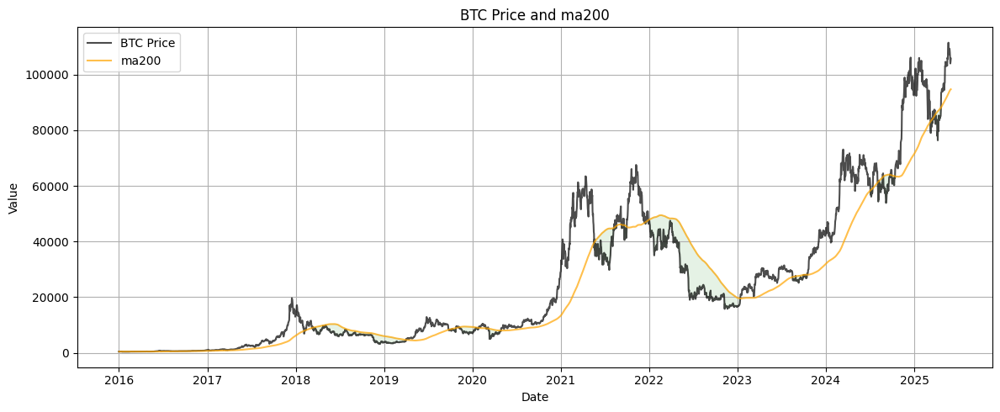


2. Plotting final weights by window...
[add_predictions_to_df] Skipping year 2020 due to insufficient data.
[add_predictions_to_df] Skipping year 2021 due to insufficient data.
[add_predictions_to_df] Skipping year 2022 due to insufficient data.
[add_predictions_to_df] Skipping year 2023 due to insufficient data.
[add_predictions_to_df] Skipping year 2024 due to insufficient data.
[compute_weights] All predictions are NaN. Using uniform weights.
[add_predictions_to_df] Skipping year 2020 due to insufficient data.
[add_predictions_to_df] Skipping year 2021 due to insufficient data.
[add_predictions_to_df] Skipping year 2022 due to insufficient data.
[add_predictions_to_df] Skipping year 2023 due to insufficient data.
[add_predictions_to_df] Skipping year 2024 due to insufficient data.
[compute_weights] All predictions are NaN. Using uniform weights.
[add_predictions_to_df] Skipping year 2020 due to insufficient data.
[add_predictions_to_df] Skipping year 2021 due to insufficient data.


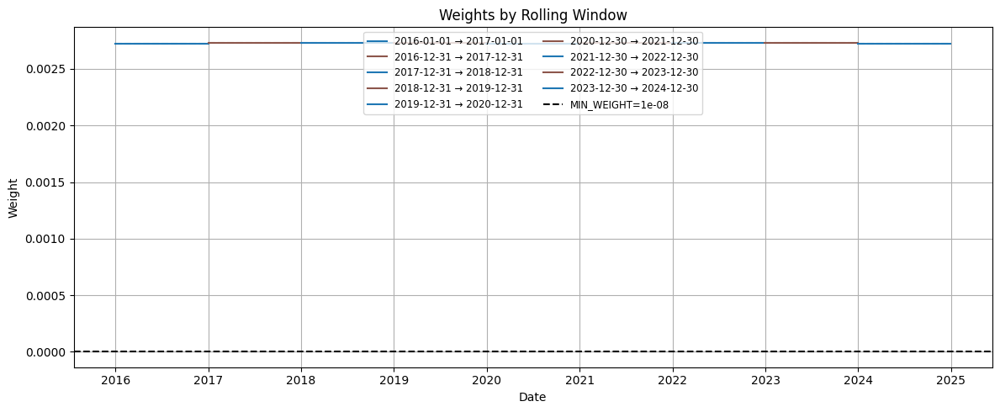


3. Checking rolling window weight sums...
[add_predictions_to_df] Skipping year 2020 due to insufficient data.
[add_predictions_to_df] Skipping year 2021 due to insufficient data.
[add_predictions_to_df] Skipping year 2022 due to insufficient data.
[add_predictions_to_df] Skipping year 2023 due to insufficient data.
[add_predictions_to_df] Skipping year 2024 due to insufficient data.
[compute_weights] All predictions are NaN. Using uniform weights.
[add_predictions_to_df] Skipping year 2020 due to insufficient data.
[add_predictions_to_df] Skipping year 2021 due to insufficient data.
[add_predictions_to_df] Skipping year 2022 due to insufficient data.
[add_predictions_to_df] Skipping year 2023 due to insufficient data.
[add_predictions_to_df] Skipping year 2024 due to insufficient data.
[compute_weights] All predictions are NaN. Using uniform weights.
[add_predictions_to_df] Skipping year 2020 due to insufficient data.
[add_predictions_to_df] Skipping year 2021 due to insufficient dat

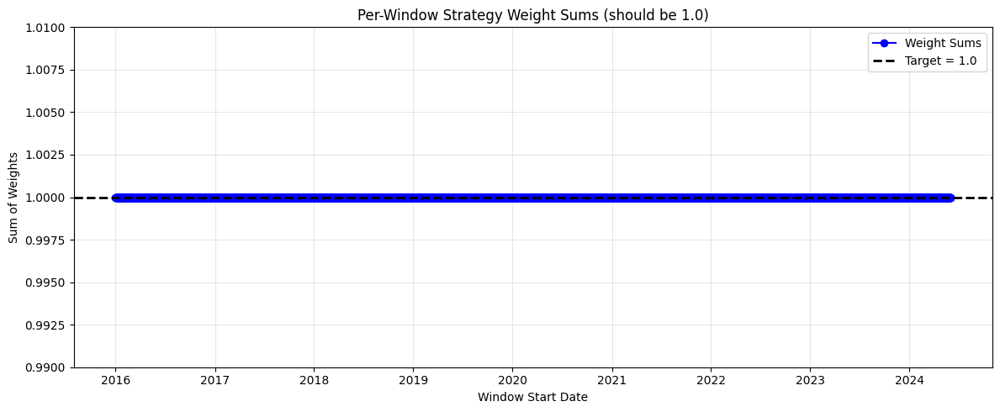


4. Running SPD backtest...
[add_predictions_to_df] Skipping year 2020 due to insufficient data.
[add_predictions_to_df] Skipping year 2021 due to insufficient data.
[add_predictions_to_df] Skipping year 2022 due to insufficient data.
[add_predictions_to_df] Skipping year 2023 due to insufficient data.
[add_predictions_to_df] Skipping year 2024 due to insufficient data.
[compute_weights] All predictions are NaN. Using uniform weights.
[add_predictions_to_df] Skipping year 2020 due to insufficient data.
[add_predictions_to_df] Skipping year 2021 due to insufficient data.
[add_predictions_to_df] Skipping year 2022 due to insufficient data.
[add_predictions_to_df] Skipping year 2023 due to insufficient data.
[add_predictions_to_df] Skipping year 2024 due to insufficient data.
[compute_weights] All predictions are NaN. Using uniform weights.
[add_predictions_to_df] Skipping year 2020 due to insufficient data.
[add_predictions_to_df] Skipping year 2021 due to insufficient data.
[add_predict

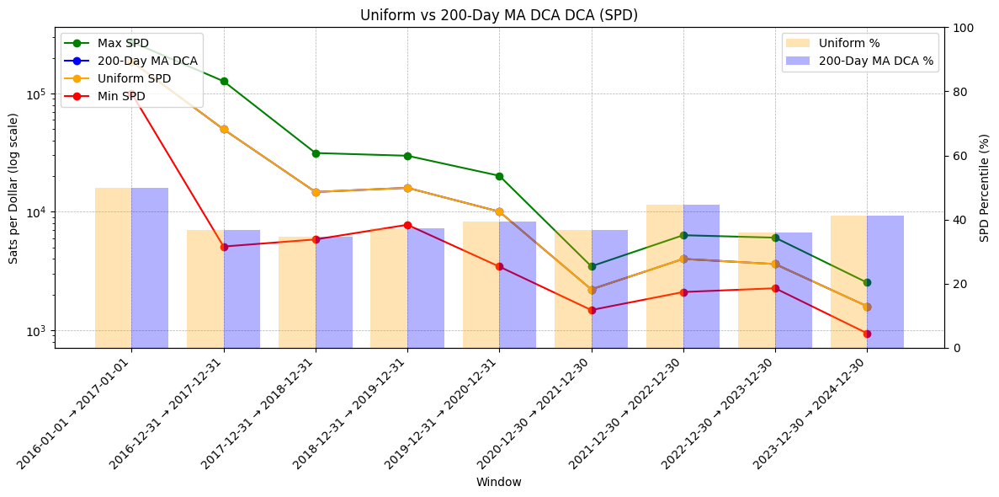


6. Running strategy validation checks...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1262, number of used features: 3
[LightGBM] [Info] Start training from score 0.082736
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1628, number of used features: 3
[LightGBM] [Info] Start training from score 0.099490
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1993, number of used featur

/var/folders/x_/ysgqb8n967l1dyqcyh5hhmc00000gn/T/ipykernel_42076/2210753701.py:28: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df["return_7d"] = df["PriceUSD_coinmetrics"].pct_change(7)
/var/folders/x_/ysgqb8n967l1dyqcyh5hhmc00000gn/T/ipykernel_42076/2210753701.py:29: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df["volatility_14d"] = df["PriceUSD_coinmetrics"].pct_change().rolling(14).std()
/var/folders/x_/ysgqb8n967l1dyqcyh5hhmc00000gn/T/ipykernel_42076/2210753701.py:34: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. 

[add_predictions_to_df] No data available for scaling. Returning original df.
[compute_weights] All predictions are NaN. Using uniform weights.
[2016-01-01] ❌ Forward-leakage detected (Δ=2.91e-04)
[add_predictions_to_df] Skipping year 2020 due to insufficient data.
[add_predictions_to_df] Skipping year 2021 due to insufficient data.
[add_predictions_to_df] Skipping year 2022 due to insufficient data.
[add_predictions_to_df] Skipping year 2023 due to insufficient data.
[add_predictions_to_df] Skipping year 2024 due to insufficient data.
[compute_weights] All predictions are NaN. Using uniform weights.
[add_predictions_to_df] Skipping year 2020 due to insufficient data.
[add_predictions_to_df] Skipping year 2021 due to insufficient data.
[add_predictions_to_df] Skipping year 2022 due to insufficient data.
[add_predictions_to_df] Skipping year 2023 due to insufficient data.
[add_predictions_to_df] Skipping year 2024 due to insufficient data.
[compute_weights] All predictions are NaN. Usin

,Window,Dynamic Percentile,Uniform Percentile,Delta
0,2016-01-01 → 2017-01-01,49.927247,49.927247,-2.131628e-14
1,2016-01-03 → 2017-01-03,50.493145,50.493145,-7.105427e-15
2,2016-01-04 → 2017-01-04,52.609983,52.609983,-3.552714e-14
3,2016-01-08 → 2017-01-08,51.903057,51.903057,-2.842171e-14
4,2016-01-09 → 2017-01-09,51.741596,51.741596,-2.131628e-14
...,...,...,...,...
903,2024-05-10 → 2025-05-10,42.195118,42.195118,-2.842171e-14
904,2024-05-13 → 2025-05-13,41.591969,41.591969,-2.131628e-14
905,2024-05-14 → 2025-05-14,41.405450,41.405450,-2.842171e-14
906,2024-05-16 → 2025-05-16,41.046080,41.046080,-2.842171e-14



Summary: Your strategy underperformed uniform DCA in 908 out of 3075 windows (70.47% win rate)
✅ Strategy meets performance requirement (≥ 50% win rate vs. uniform DCA).

⚠️ Please address the above issues before submitting.

7. Computing final score...

Final Model Score (50/50 weighting): 31.16%


In [43]:
print("Starting Bitcoin DCA Strategy Analysis...")

# Load and prepare data
print("Loading data...")
btc_df = load_data()
btc_df = btc_df.loc[BACKTEST_START:BACKTEST_END]
print(f"Data loaded: {len(btc_df)} records from {BACKTEST_START} to {BACKTEST_END}")

# 1) Feature plot (no weights)
print("\n1. Plotting features...")
plot_features(btc_df)

# 2) Final weights curves—computed per window
print("\n2. Plotting final weights by window...")
plot_final_weights_by_window(
    btc_df,
    compute_weights,
    window_stride=365
)

# 3) Per-window weight-sum check
print("\n3. Checking rolling window weight sums...")
plot_rolling_window_weight_sums(
    btc_df,
    compute_weights
)

# 4) Rolling-window SPD backtest
print("\n4. Running SPD backtest...")
df_spd, exp_decay_percentile = backtest_dynamic_dca(
    btc_df,
    compute_weights,
    strategy_label="200-Day MA DCA"
)

# 5) SPD comparison (subsampled by window_stride)
print("\n5. Plotting SPD comparison...")
plot_spd_comparison(
    df_spd,
    strategy_name="200-Day MA DCA",
    window_stride=365
)

# 6) Sanity checks (each window inside)
print("\n6. Running strategy validation checks...")
check_strategy_submission_ready(btc_df, compute_weights)

# win-rate = % of windows where dynamic beats uniform
win_rate = (df_spd["dynamic_percentile"] > df_spd["uniform_percentile"]).mean() * 100

# 7) Final scoring
print("\n7. Computing final score...")

score = 0.5 * win_rate + 0.5 * exp_decay_percentile
print(f"\nFinal Model Score (50/50 weighting): {score:.2f}%")